### Methods and packages 

In [1]:
%run methods_sulfate_deposition.ipynb

/Users/feliciacarlborg/opt/anaconda3/lib/python3.8/site-packages/nbformat/__init__.py:92: MissingIDFieldWarning: Code cell is missing an id field, this will become a hard error in future nbformat versions. You may want to use `normalize()` on your notebooks before validations (available since nbformat 5.1.4). Previous versions of nbformat are fixing this issue transparently, and will stop doing so in the future.
  validate(nb)


In [2]:
%matplotlib inline
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
matplotlib.use('nbAgg')
import scipy as scipy
import warnings 
from tabulate import tabulate
from scipy import interpolate
from scipy import signal
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
import itertools
from tqdm import tqdm
import seaborn as sns
from scipy.stats.stats import pearsonr
from sklearn.linear_model import LinearRegression

from matplotlib.widgets import Slider, RadioButtons
from itertools import zip_longest

np.set_printoptions(threshold=np.inf)
sns.set_theme(context='paper', style='white', palette='colorblind',font='Helvetica')

## Bipolar eruptions 

In [3]:
exc_sheet_bp_mp = pd.ExcelFile('Bipolar match points ver 2022-12-23.xls')
bp_mp = pd.read_excel(exc_sheet_bp_mp, 'Sheet1')
bp_mp = np.array(bp_mp)

depth_bp_NGRIP = np.array(bp_mp[:,0], dtype='float64')
depth_bp_EDML = np.array(bp_mp[:,1], dtype='float64')

### All raw data & thickness

In [4]:
##retrieving data that will be needed. 

%store -r EDML_d18O
%store -r EDML_d18O_age
%store -r EDML_d18O_depth
%store -r EDML_thinning_depth
%store -r EDML_thinning
%store -r EDML_acc
%store -r EDML_jiamei_dep
%store -r EDML_jiamei_age
%store -r EDML_depth_all
%store -r EDML_age_all
%store -r EDML_sulfate_all

EDML_depth = np.copy(EDML_depth_all)
EDML_age = np.copy(EDML_age_all)
EDML_sulfate = np.copy(EDML_sulfate_all)

#EDML_depth = EDML_depth[~np.isnan(EDML_age)] #making sure we are not using nan-values 
#EDML_sulfate = EDML_sulfate[~np.isnan(EDML_age)]
#EDML_age = EDML_age[~np.isnan(EDML_age)]

EDML_thickness = EDML_depth[1:] - EDML_depth[:-1] #thickness is not interpolated now 

%store EDML_thickness


Stored 'EDML_thickness' (ndarray)


## Original GICC05 timescale from NGRIP - So that all depths correspond to the correct age 

In [5]:
## Downloading data
excel = pd.ExcelFile('2010-11-19 GICC05modelext for NGRIP 2.xls')
GICC05 = pd.read_excel(excel, 'GICC05')
GICC05= np.array(GICC05)

NGRIP_age_GICC05 = np.array(GICC05[70:, 0], dtype='float64')
NGRIP_depth_GICC05 = np.array(GICC05[70:, 1], dtype='float64')

In [6]:
## This is the GICC05 timeseries that we want all our cores to be in. 
plt.figure(figsize=(5,3))
plt.plot(NGRIP_age_GICC05, NGRIP_depth_GICC05)
plt.xlabel('NGRIP GICC05 Age')
plt.ylabel('NGRIP GICC05 Depth')
plt.gca().invert_yaxis()

<IPython.core.display.Javascript object>

In [7]:
## This is along the points we want to start our first interpolation since they are connected.
plt.figure(figsize=(5,3)) 
plt.plot(depth_bp_EDML, depth_bp_NGRIP)
plt.xlabel('Depth bp EDML (m)')
plt.ylabel('Depth bp NGRIP (m)')
plt.show()

<IPython.core.display.Javascript object>

In [8]:
#1. first interpolation. We want a new correspoding depth in NGRIP to fit the depth with EDML. 
lim_EDML = np.where( (EDML_depth > 700)  & (EDML_depth < 2232) )
ak = interpolate.interp1d(depth_bp_EDML[np.isfinite(depth_bp_EDML) & np.isfinite(depth_bp_NGRIP)], depth_bp_NGRIP[np.isfinite(depth_bp_EDML) & np.isfinite(depth_bp_NGRIP)], fill_value='extrapolate')
NGRIP_depth_new = ak(EDML_depth[lim_EDML]) ##interpolation so I get new depth for NGRIP
##interpolating the nans for xp and fp since we want a smooth line to interpolate on. 
len(NGRIP_depth_new), len(EDML_depth[lim_EDML])

(100283, 100283)

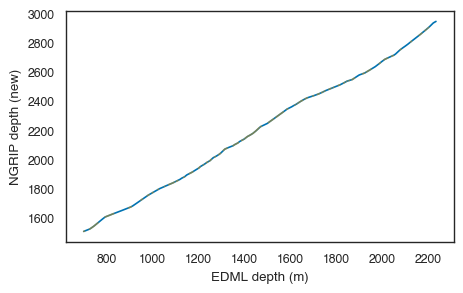

In [9]:
##The interpolated updated NGRIP depth 
%matplotlib inline
plt.figure(figsize=(5,3))
plt.plot(EDML_depth[lim_EDML], NGRIP_depth_new )
plt.plot(depth_bp_EDML, depth_bp_NGRIP, alpha=.5)
plt.xlabel('EDML depth (m)')
plt.ylabel('NGRIP depth (new)')
plt.show()

In [10]:
#2. Second interpolation. Getting the EDML GICC05 age correct (that corresponds to our updated NGRIP depth (that corresponds to the depth of EDML))
ak = interpolate.Akima1DInterpolator(NGRIP_depth_GICC05, NGRIP_age_GICC05)
EDML_age_new = ak(NGRIP_depth_new)##Interpolation so I get the new age for EDML

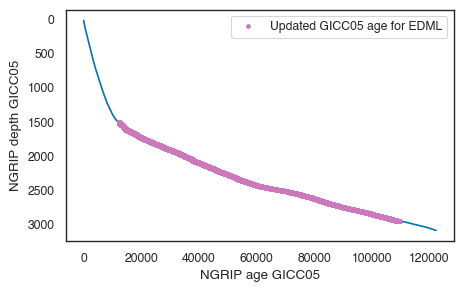

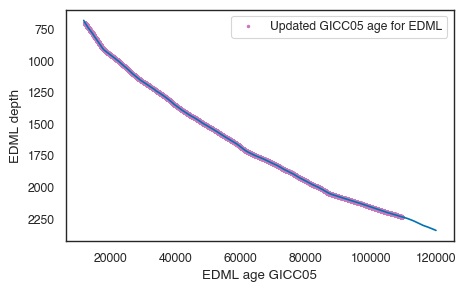

In [11]:
## The new EDML age vs the updated NGRIP depth (that corresponds to EDML depth)
plt.figure(figsize=(5,3))
plt.plot(NGRIP_age_GICC05, NGRIP_depth_GICC05)
plt.plot(EDML_age_new, NGRIP_depth_new, 'm.', label='Updated GICC05 age for EDML')
plt.ylabel('NGRIP depth GICC05')
plt.xlabel('NGRIP age GICC05')
plt.gca().invert_yaxis()
plt.legend()

##updated EDML age for corresponding original EDML depth 
plt.figure(figsize=(5,3))
plt.plot(EDML_age_new, EDML_depth[lim_EDML], 'm.', label='Updated GICC05 age for EDML', markersize=3)
plt.plot(EDML_age, EDML_depth)
plt.ylabel('EDML depth')
plt.xlabel('EDML age GICC05')
plt.gca().invert_yaxis()
plt.legend()

In [12]:
len(EDML_age), len(EDML_age_new[np.isfinite(EDML_age_new)])

(113241, 100283)

In [13]:

#storing the updated EDML_age 
%store EDML_age_new

EDML_age = np.copy(EDML_age_new)

Stored 'EDML_age_new' (ndarray)


### Thinning

In [14]:
EDML_thinning_depth = np.array(EDML_thinning_depth, dtype='float64')
EDML_thinning = np.array(EDML_thinning, dtype='float64')
print(len(EDML_age), len(EDML_depth), len(EDML_sulfate), len(EDML_thinning_depth), len(EDML_thinning), len(EDML_depth_all))

EDML_depth_th = (EDML_depth[1:] + EDML_depth[:-1])/2
EDML_thinning_corr = np.interp(EDML_depth_th, EDML_thinning_depth, EDML_thinning)

%store EDML_thinning_corr
%store EDML_depth_th

100283 113241 113241 1564 1564 113241
Stored 'EDML_thinning_corr' (ndarray)
Stored 'EDML_depth_th' (ndarray)


### Accumulation

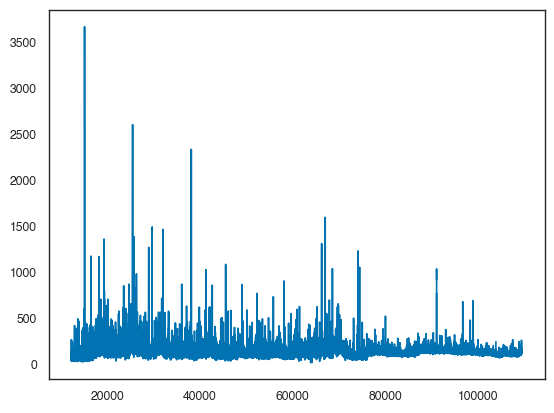

In [15]:
%matplotlib inline
EDML_acc = np.array(EDML_acc, dtype='float64')
EDML_acc_depth = np.interp(EDML_depth, EDML_thinning_depth, EDML_acc)
EDML_acc_age = np.interp(EDML_thinning_depth, EDML_depth[lim_EDML], EDML_age, left = np.nan, right= np.nan )

plt.figure()
plt.plot(EDML_age, EDML_sulfate[lim_EDML])
plt.show()

(12199.429371996095,
 109495.27372410515,
 0.051135417263427116,
 0.0928096,
 0.0296139)

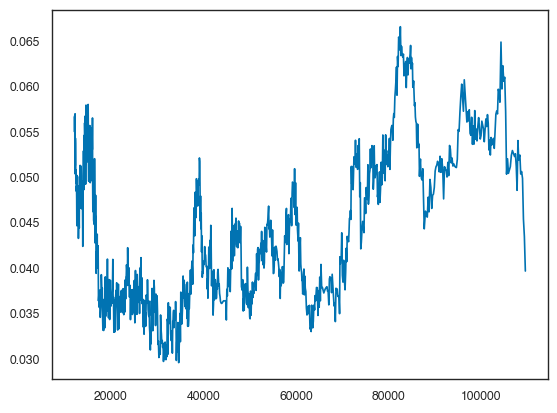

In [16]:
plt.figure()
plt.plot(EDML_acc_age, EDML_acc)

mean_accumulation_EDML = np.nanmean(EDML_acc)
max_accumulation_EDML = np.nanmax(EDML_acc)
min_accumulation_EDML = np.nanmin(EDML_acc)

EDML_acc_age[np.isfinite(EDML_acc_age)][0], EDML_acc_age[np.isfinite(EDML_acc_age)][-1], mean_accumulation_EDML, max_accumulation_EDML, min_accumulation_EDML

### Filter lengths and age list

In [17]:
EDML_age_list = np.arange(10*1e3,112*1e3,2000) #list with ages for the different intervals
EDML_filt_1 = np.arange(45,110,2) #list with the different filter lengths for RM 155 innan
EDML_filt_2 =  np.insert(EDML_filt_1, 0, 45)
EDML_filt_3 = np.ones(22)*110
EDML_filt  = np.concatenate((EDML_filt_2, EDML_filt_3), axis=None)

In [18]:
thresholds = np.arange(.5,4.5,.5)

all_RMAD_EDML = pd.DataFrame()
all_RRM_EDML = pd.DataFrame()
    

for i in range(len(thresholds)):
    EDML_RRM_test = np.array([])
    EDML_RMAD_test = np.array([])
    
    print('i =', i)
    
    for j in range(len(EDML_age_list)-1):
        #print('j=', j)
        idx = np.where((EDML_age >= EDML_age_list[j] - EDML_filt[j]) & (EDML_age < EDML_age_list[j+1] + EDML_filt[j]))
        idx_filt_1 = len(np.where((EDML_age >= EDML_age_list[j] - EDML_filt[j]) & (EDML_age < EDML_age_list[j]))[0])
        idx_filt_2 = len(np.where((EDML_age <= EDML_age_list[j+1] + EDML_filt[j]) & (EDML_age > EDML_age_list[j+1]))[0])
        
        if j == 0: 
            EDML_exl_volc_test= exl_volcanism(EDML_age[idx], EDML_sulfate[lim_EDML][idx],EDML_filt[j],thresholds[i])
            EDML_RRM_test = np.concatenate( (EDML_RRM_test, running_median(EDML_age[idx], EDML_exl_volc_test, EDML_filt[j])[:-idx_filt_2]),  axis=None)
            EDML_RMAD_test = np.concatenate( (EDML_RMAD_test, median_of_absolute_deviation(EDML_age[idx],  EDML_exl_volc_test, EDML_filt[j], thresholds[i])[:-idx_filt_2]), axis=None)
            
        elif j == len(EDML_age_list) - 2:
            EDML_exl_volc_test = exl_volcanism(EDML_age[idx], EDML_sulfate[lim_EDML][idx],EDML_filt[j],thresholds[i])
            EDML_RRM_test = np.concatenate( (EDML_RRM_test, running_median(EDML_age[idx], EDML_exl_volc_test, EDML_filt[j])[idx_filt_1:]),  axis=None)
            EDML_RMAD_test = np.concatenate( (EDML_RMAD_test, median_of_absolute_deviation(EDML_age[idx],  EDML_exl_volc_test, EDML_filt[j], thresholds[i])[idx_filt_1:]), axis=None)
            break
        
        else:
            EDML_exl_volc_test = exl_volcanism(EDML_age[idx], EDML_sulfate[lim_EDML][idx],EDML_filt[j],thresholds[i])
            EDML_RRM_test = np.concatenate( (EDML_RRM_test, running_median(EDML_age[idx], EDML_exl_volc_test, EDML_filt[j])[idx_filt_1:-idx_filt_2]),  axis=None)
            EDML_RMAD_test = np.concatenate( (EDML_RMAD_test, median_of_absolute_deviation(EDML_age[idx],  EDML_exl_volc_test, EDML_filt[j], thresholds[i])[idx_filt_1:-idx_filt_2]), axis=None)
            
    #NEEM_exl_volc_test = np.array(NEEM_exl_volc_test)
    #NEEM_RRM_test = np.array(NEEM_RRM_test)
    #NEEM_RMAD_test = np.array(NEEM_RMAD_test)
      
    all_RRM_EDML[i] = EDML_RRM_test
    all_RMAD_EDML[i] = EDML_RMAD_test

i = 0
i = 1
i = 2
i = 3
i = 4
i = 5
i = 6
i = 7


In [19]:
np.shape(all_RMAD_EDML), len(EDML_age)

((100283, 8), 100283)

In [20]:
all_RMAD_EDML = np.array(all_RMAD_EDML)
all_RRM_EDML = np.array(all_RRM_EDML)

%store all_RMAD_EDML
%store all_RRM_EDML

Stored 'all_RMAD_EDML' (ndarray)
Stored 'all_RRM_EDML' (ndarray)


In [21]:
len(EDML_age_new[np.isfinite(EDML_age_new)]), len(all_RMAD_EDML[:,3])
table = zip_longest(EDML_depth[lim_EDML][np.isfinite(EDML_age_new)], EDML_age_new[np.isfinite(EDML_age_new)], all_RMAD_EDML[:,3])
print(tabulate(table))

--------  --------  --------
 700.016   12166.5   87.43
 700.033   12166.9   87.43
 700.05    12167.3   87.43
 700.067   12167.7   87.43
 700.084   12168.1   87.43
 700.101   12168.6   87.43
 700.118   12169     87.43
 700.135   12169.4   87.43
 700.152   12169.8   87.43
 700.169   12170.2   87.43
 700.186   12170.6   87.43
 700.203   12171.1   87.43
 700.22    12171.5   87.43
 700.237   12171.9   87.43
 700.255   12172.3   87.43
 700.272   12172.7   87.43
 700.289   12173.1   87.43
 700.312   12173.7   87.43
 700.329   12174.1   87.43
 700.346   12174.5   87.43
 700.363   12174.9   87.43
 700.38    12175.3   87.43
 700.397   12175.7   87.43
 700.414   12176.1   87.43
 700.431   12176.5   87.43
 700.448   12176.9   87.43
 700.465   12177.3   87.43
 700.482   12177.7   87.43
 700.499   12178.1   87.43
 700.516   12178.5   87.43
 700.533   12178.9   87.43
 700.55    12179.3   87.43
 700.567   12179.6   87.43
 700.584   12180     87.43
 700.602   12180.4   87.43
 700.619   12180.8   87.43

### Background filter and d18O

45.0 0 0


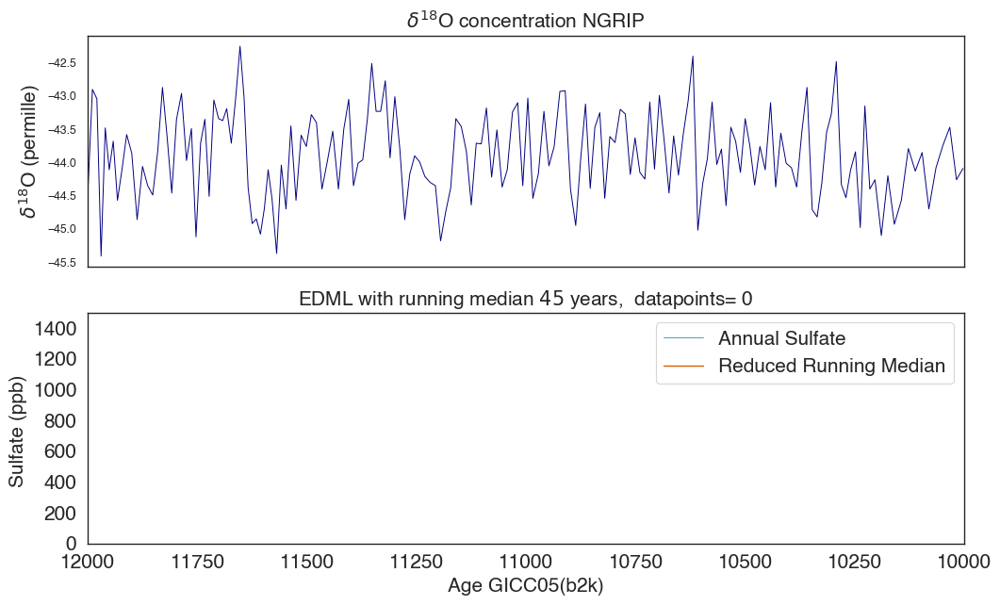

45.0 0 61
47.0 80 98
49.0 46 61
51.0 63 59
53.0 57 59
55.0 60 70
57.0 68 40
59.0 65 71
61.0 76 60
63.0 71 58
65.0 64 72
67.0 68 73
69.0 80 80
71.0 80 65
73.0 53 72
75.0 78 62
77.0 67 70
79.0 62 76
81.0 74 71
83.0 74 65
85.0 74 80


/var/folders/st/s794rfks0m1cxyggxfnyq21r0000gn/T/ipykernel_7740/1221679079.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, (ax1, ax2) = plt.subplots(2, 1, sharex=True,  figsize=(12, 7))


87.0 75 72
89.0 68 81
91.0 82 106
93.0 104 67
95.0 75 100
97.0 102 63
99.0 58 64
101.0 68 60
103.0 63 91
105.0 90 64
107.0 86 96
109.0 86 163
110.0 195 149
110.0 149 137
110.0 140 135
110.0 130 177
110.0 164 79
110.0 102 94
110.0 92 85
110.0 87 90
110.0 88 89
110.0 89 96
110.0 95 98
110.0 96 106
110.0 109 74
110.0 85 82
110.0 84 99
110.0 96 0
49
49


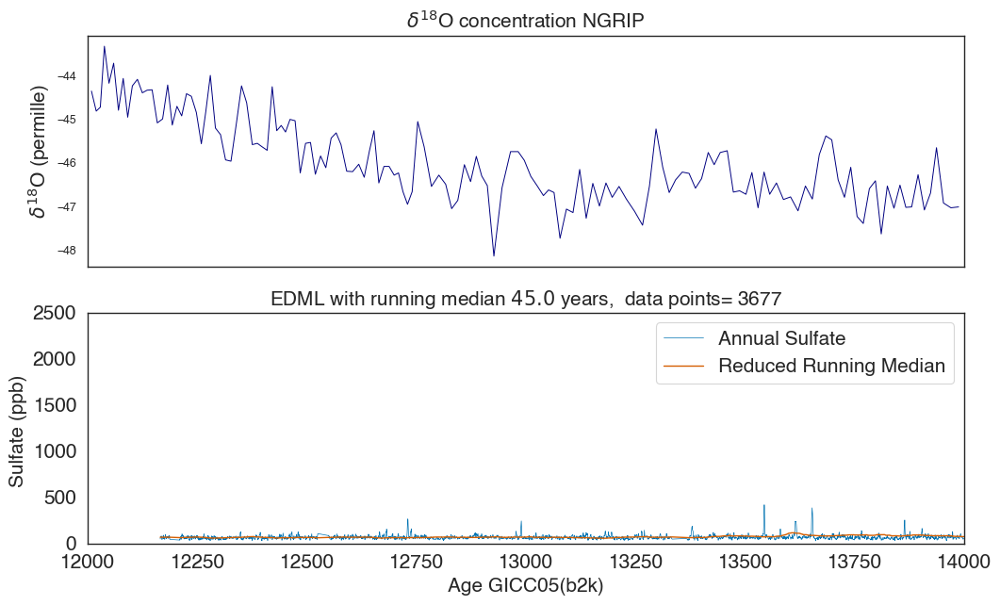

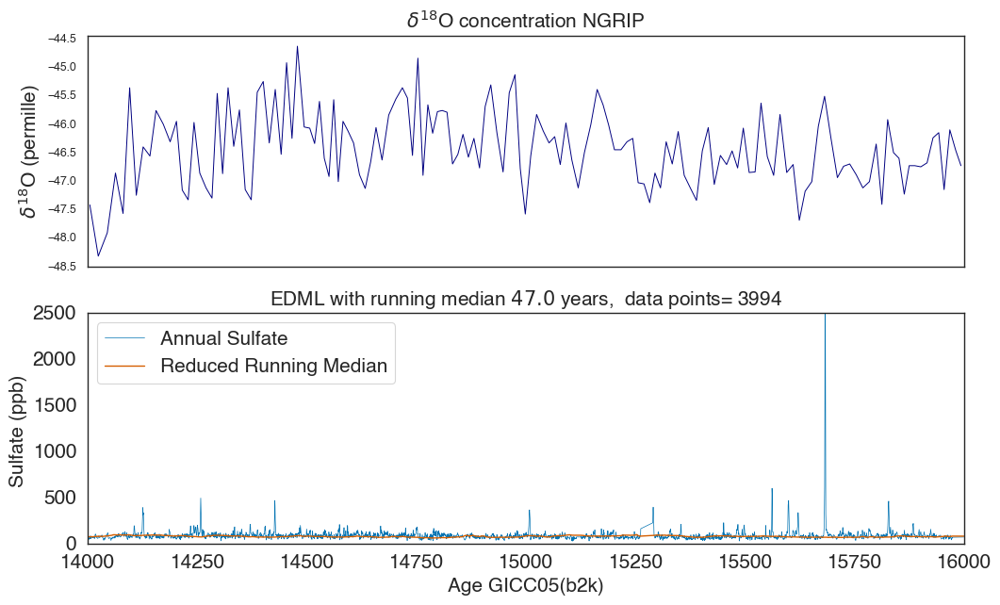

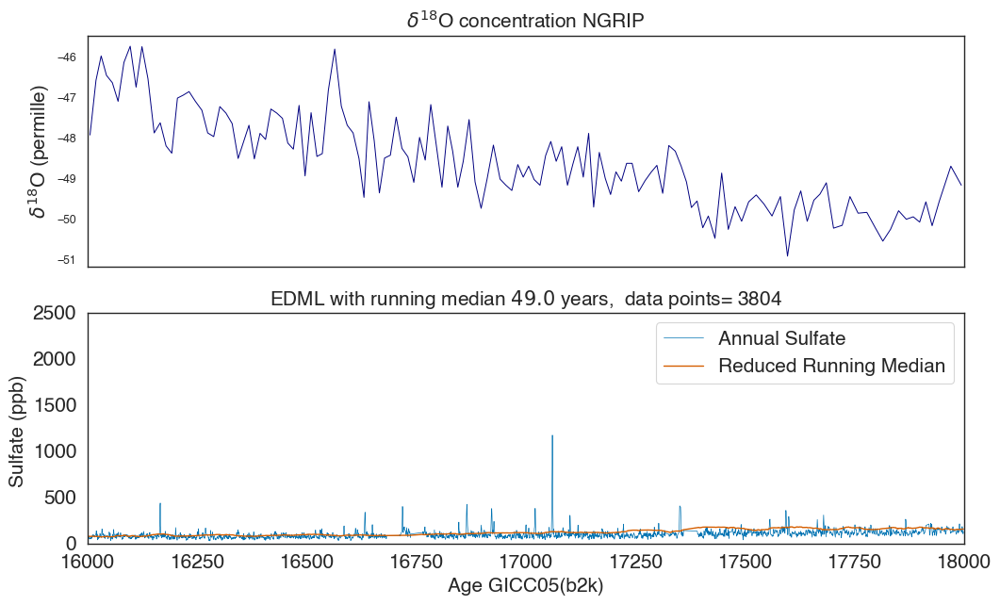

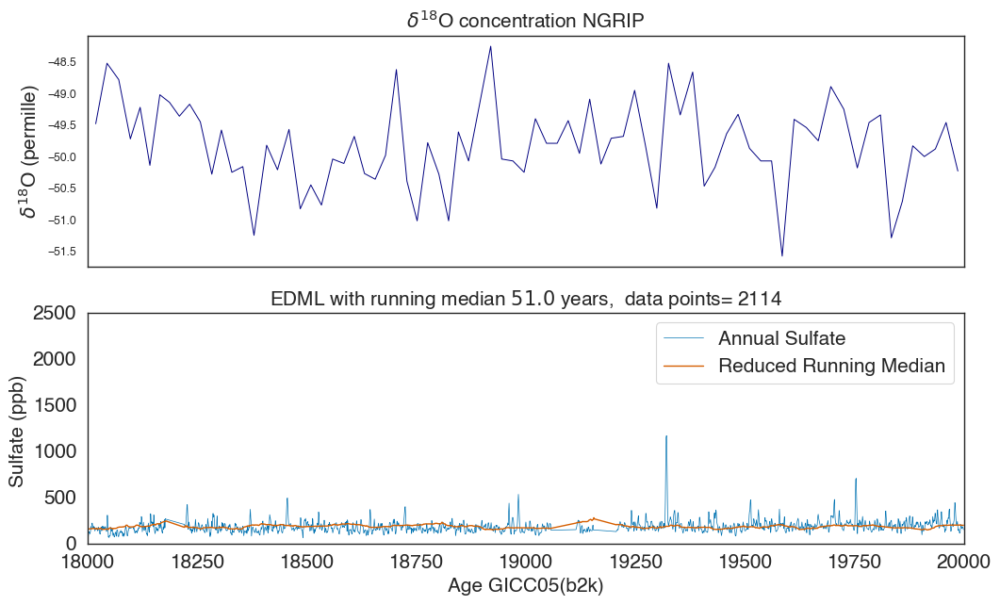

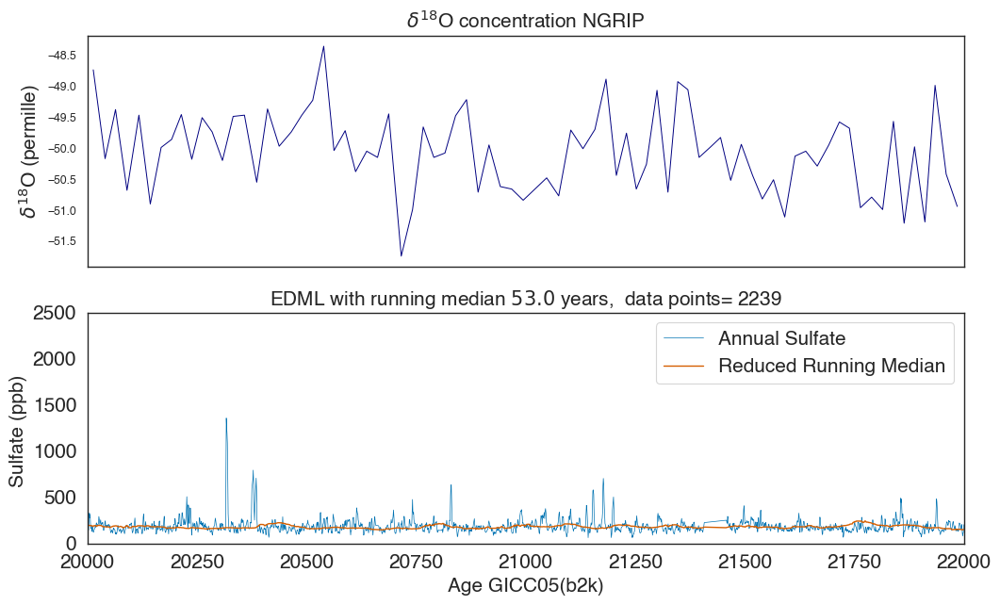

...

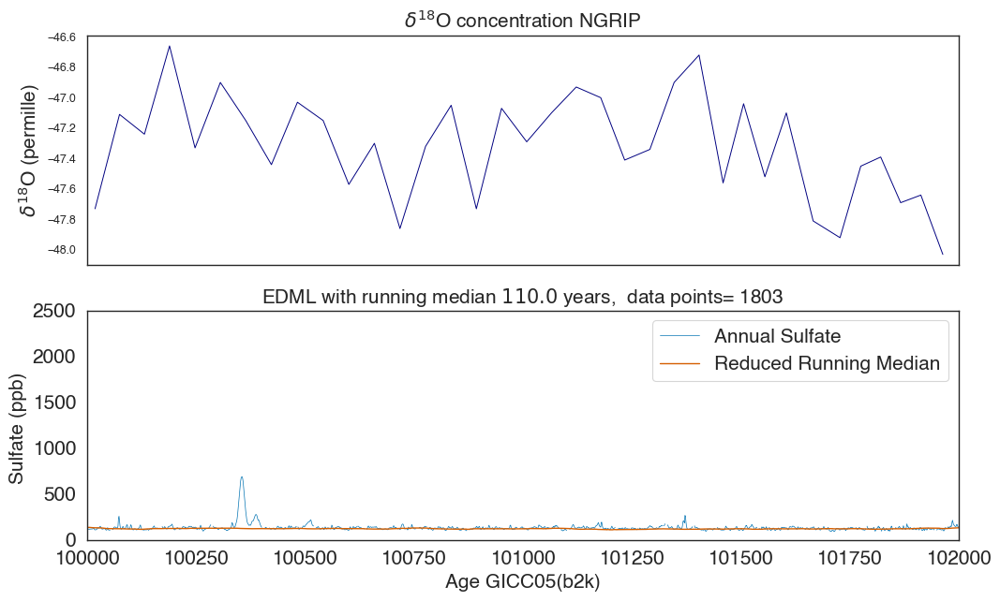

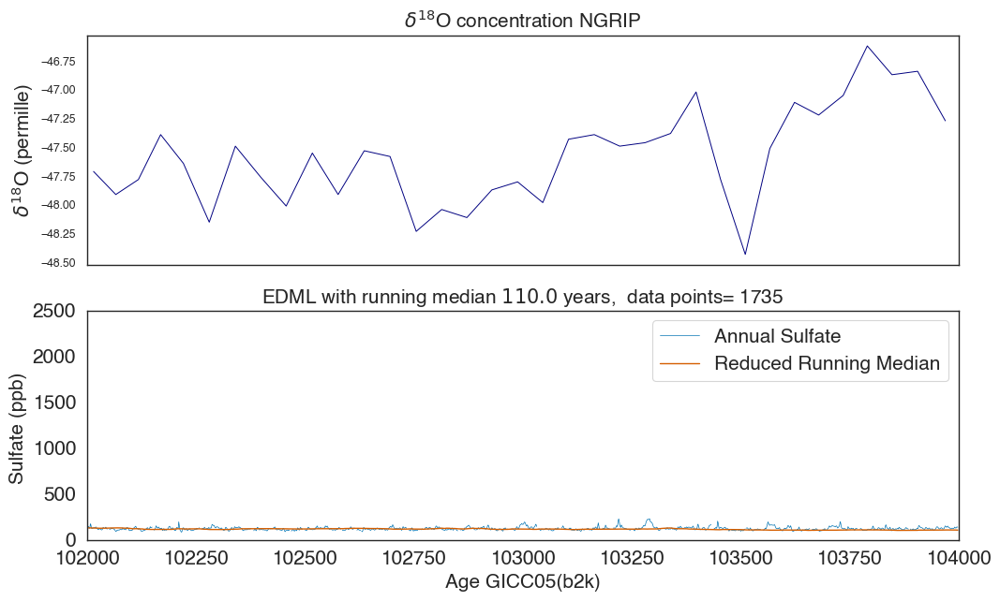

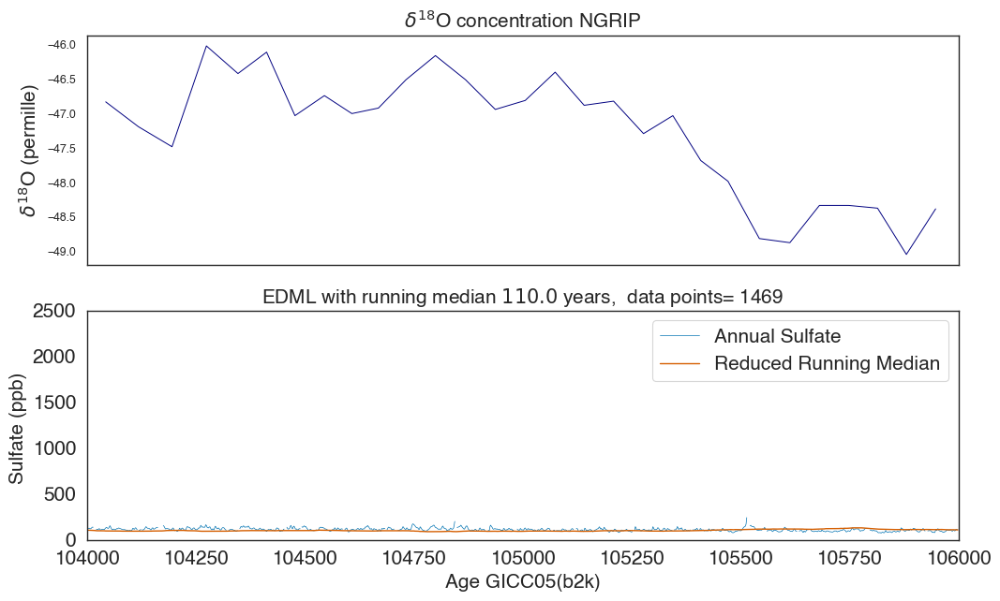

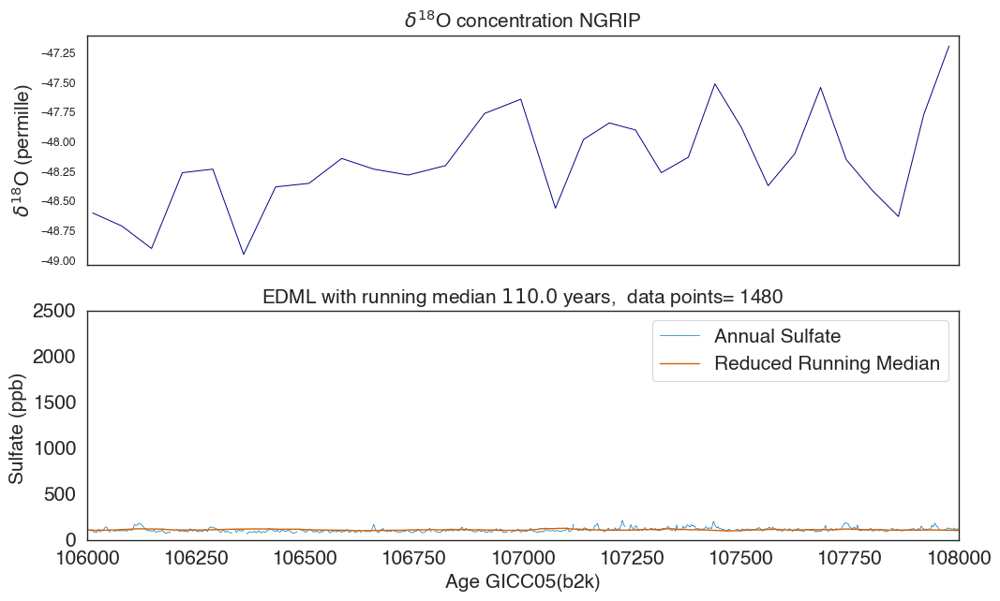

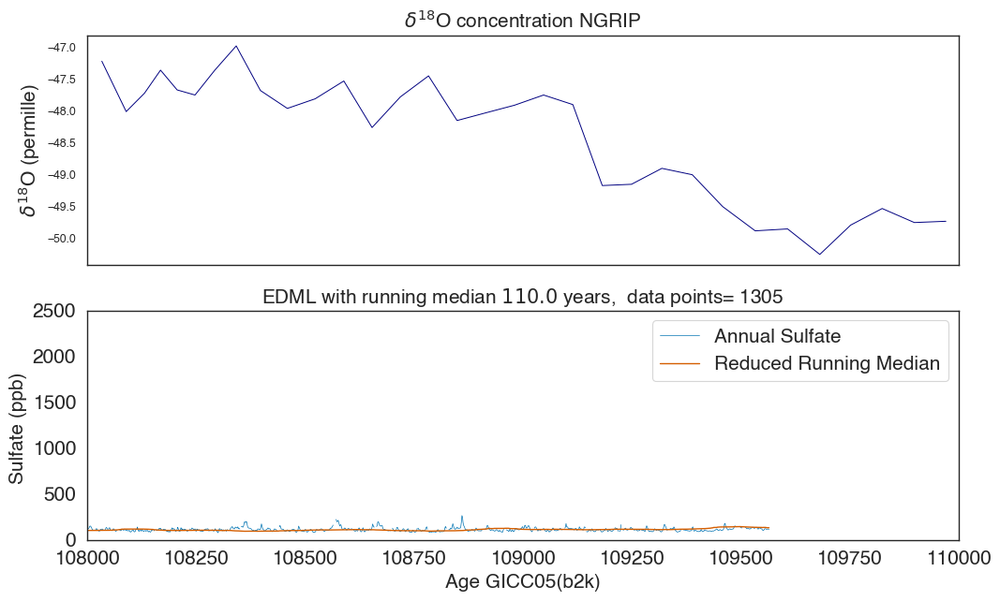

In [42]:

%matplotlib inline
data_points = [] #empty array to count data points
EDML_RM_list = []
EDML_RMAD_list = []
EDML_RRM_list = [] #empty array for the background data
EDML_RRMAD_list = [] #empty array for the RMAD

for i in range(len(EDML_age_list)-1):
    
    ### idx for what interval to plot ###
    idx = np.where((EDML_age >= EDML_age_list[i] - EDML_filt[i]) & (EDML_age < EDML_age_list[i+1] + EDML_filt[i]))
    idx2 = np.where((EDML_age >= EDML_age_list[i]) & (EDML_age < EDML_age_list[i+1]))
    
    ### idx for choosing the correct array length for RRM and RMAD
    idx_filt_1 = len(np.where((EDML_age >= EDML_age_list[i] - EDML_filt[i]) & (EDML_age < EDML_age_list[i]))[0])
    idx_filt_2 = len(np.where((EDML_age <= EDML_age_list[i+1] + EDML_filt[i]) & (EDML_age > EDML_age_list[i+1]))[0])
    
    print(EDML_filt[i], idx_filt_1, idx_filt_2)
    
    ### Finding the background and volcanic threshold 
    EDML_exl_volc = exl_volcanism(EDML_age[idx], EDML_sulfate[lim_EDML][idx],EDML_filt[i],3)
    EDML_RRM = running_median(EDML_age[idx], EDML_exl_volc, EDML_filt[i])
    EDML_RMAD = median_of_absolute_deviation(EDML_age[idx], EDML_sulfate[lim_EDML][idx], EDML_filt[i], z=3)
    EDML_RRMAD = median_of_absolute_deviation(EDML_age[idx], EDML_exl_volc, EDML_filt[i], z=3)
    
    ### short age and sulfate arrays for plotting ###
    EDML_age_s = EDML_age[idx2]
    EDML_sulfate_s = EDML_sulfate[idx2]
    
    ### counting the number of data points in each interval ###
    EDML_sulfate_count = len(EDML_age[idx2])
    data_points.append(EDML_sulfate_count)
    
    ### idx for the oxygen isotope data ### 
    idx_ox = np.where((EDML_d18O_age > EDML_age_list[i]) & (EDML_d18O_age < EDML_age_list[i+1]))
        
    ### Plotting all the data ###
    if i == 0:
        
        ### saving the RRM and RMAD values ###
        EDML_RRM_list.append(EDML_RRM[: -idx_filt_2])
        EDML_RMAD_list.append(EDML_RMAD[: -idx_filt_2])
        EDML_RRMAD_list.append(EDML_RRMAD[: -idx_filt_2])
    
        ### subplots ###
        f, (ax1, ax2) = plt.subplots(2, 1, sharex=True,  figsize=(12, 7))
        
        ### d18O plot ###
        ax1.set_title('$\delta^{18}$O concentration NGRIP', fontsize=15)
        ax1.plot(EDML_d18O_age[idx_ox], EDML_d18O[idx_ox], color='navy', linewidth=.7)
        ax1.set_ylabel('$\delta^{18}$O (permille)', fontsize=15)
        plt.xlim(10000,12000)
       
        ### sulfate plot ###
        ax2.plot(EDML_age_s, EDML_sulfate_s, linewidth=.5, label = 'Annual Sulfate', color='b')
        ax2.plot(EDML_age_s, EDML_RRM[:-idx_filt_2], linewidth = 1, label = 'Reduced Running Median', color='r')
        #plt.plot(EDML_annual_s, EDML_RRMAD[: -EDML_filt[i]], linewidth=1, label = 'MAD', color='gold')
        plt.legend(fontsize=15)
        ax2.set_xlabel('Age GICC05(b2k)', fontsize=15)
        ax2.set_ylabel('Sulfate (ppb) ', fontsize=15)
        ax2.set_ylim(0,1500)
        plt.xlim(EDML_age_list[i], EDML_age_list[i+1])
        plt.legend(fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        plt.gca().invert_xaxis()
        ax2.set_title('EDML with running median $'+str(int(EDML_filt[i]))+'$ years,  datapoints= ' +str(EDML_sulfate_count), fontsize=15)
        #plt.savefig('EDML_' + str(EDML_annual_s[-1])+ '_' + str(EDML_annual_s[0]) + '_' + str(EDML_filt[i]) + '_RM.jpg', dpi=1000, bbox_inches='tight')  
        plt.show()
      
        
    elif i == len(EDML_age_list) -2:
        ### saving the RRM and RMAD values ###
        print(i)
        EDML_RRM_list.append(EDML_RRM[idx_filt_1:])
        EDML_RMAD_list.append(EDML_RMAD[idx_filt_1:])
        EDML_RRMAD_list.append(EDML_RRMAD[idx_filt_1:])
        print(i)
       
        ### subplots ###
        f, (ax1, ax2) = plt.subplots(2, 1, sharex=True,  figsize=(12, 7))
        
        ### d18O plot ###
        ax1.set_title('$\delta^{18}$O concentration NGRIP', fontsize=15)
        ax1.plot(EDML_d18O_age[idx_ox], EDML_d18O[idx_ox], color='navy', linewidth=.7)
        ax1.set_ylabel('$\delta^{18}$O (permille)', fontsize=15)
        
        ### sulfate plot ###
        ax2.plot(EDML_age_s, EDML_sulfate_s, linewidth=.5, label = 'Annual Sulfate', color='b')
        ax2.plot(EDML_age_s, EDML_RRM[idx_filt_1:], linewidth = 1, label = 'Reduced Running Median', color='r')
        #plt.plot(EDML_annual_s, EDML_RMAD[idx], linewidth=1, label = 'RMAD', color='gold')
        plt.legend(fontsize=15)
        ax2.set_ylim(0,2500)
        ax2.set_xlabel('Age GICC05(b2k)', fontsize=15)
        ax2.set_ylabel('Sulfate (ppb) ', fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        plt.gca().invert_xaxis()
        plt.xlim(EDML_age_list[i], EDML_age_list[i+1])
        plt.title('EDML with running median $'+str(EDML_filt[i])+'$ years,  data points= ' +str(EDML_sulfate_count), fontsize=15)
        #plt.savefig('EDML_' + str(EDML_annual_s[-1])+ '_' + str(EDML_annual_s[0]) + '_' + str(EDML_filt[i]) + '_RM.jpg', dpi=1000, bbox_inches='tight')
        plt.show()
        #else: 
            #continue
       
        break
    
    else:
        ### saving the RRM and RMAD values ###
        EDML_RRM_list.append(EDML_RRM[idx_filt_1: -idx_filt_2])
        EDML_RMAD_list.append(EDML_RMAD[idx_filt_1: -idx_filt_2])
        EDML_RRMAD_list.append(EDML_RRMAD[idx_filt_1: -idx_filt_2])
 
        ### subplots ###
        f, (ax1, ax2) = plt.subplots(2, 1, sharex=True,  figsize=(12, 7))
        
        ### d18O plot ### 
        ax1.set_title('$\delta^{18}$O concentration NGRIP', fontsize=15)
        ax1.plot(EDML_d18O_age[idx_ox], EDML_d18O[idx_ox], color='navy', linewidth=.7)
        ax1.set_ylabel('$\delta^{18}$O (permille)', fontsize=15)
        
        ### sulfate plot ###
        ax2.plot(EDML_age_s, EDML_sulfate_s, linewidth=.5, label = 'Annual Sulfate', color='b')
        ax2.plot(EDML_age_s, EDML_RRM[idx_filt_1: -idx_filt_2], linewidth = 1, label = 'Reduced Running Median', color='r')
        #plt.plot(EDML_annual_s, EDML_RMAD[idx], linewidth=1, label = 'RMAD', color='gold')
        plt.legend(fontsize=15)
        ax2.set_ylim(0,2500)
        ax2.set_xlabel('Age GICC05(b2k)', fontsize=15)
        ax2.set_ylabel('Sulfate (ppb) ', fontsize=15)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
        plt.gca().invert_xaxis()
        plt.xlim(EDML_age_list[i], EDML_age_list[i+1])
        plt.title('EDML with running median $'+str(EDML_filt[i])+'$ years,  data points= ' +str(EDML_sulfate_count), fontsize=15)
        #if i == 20:
            #plt.savefig('EDML_' + str(EDML_annual_s[-1])+ '_' + str(EDML_annual_s[0]) + '_' + str(EDML_filt[i]) + '_RM.jpg', dpi=1000, bbox_inches='tight')
        #plt.show()
 


### Background and Volcanic detection as lists

In [23]:
EDML_RRM_list = np.array(EDML_RRM_list, dtype='object')
EDML_RMAD_list = np.array(EDML_RMAD_list, dtype='object')
EDML_RRMAD_list = np.array(EDML_RRMAD_list, dtype='object')
EDML_RRM = [item for sublist in EDML_RRM_list for item in sublist]
EDML_RMAD = [item for sublist in EDML_RMAD_list for item in sublist]
EDML_RRMAD = [item for sublist in EDML_RRMAD_list for item in sublist]

%store EDML_RRM
%store EDML_RMAD
%store EDML_RRMAD

Stored 'EDML_RRM' (list)
Stored 'EDML_RMAD' (list)
Stored 'EDML_RRMAD' (list)


In [24]:
len(EDML_RRM), len(EDML_RRMAD), len(EDML_RMAD), len(EDML_sulfate[lim_EDML])

(100283, 100283, 100283, 100283)

### d18O against sulfate

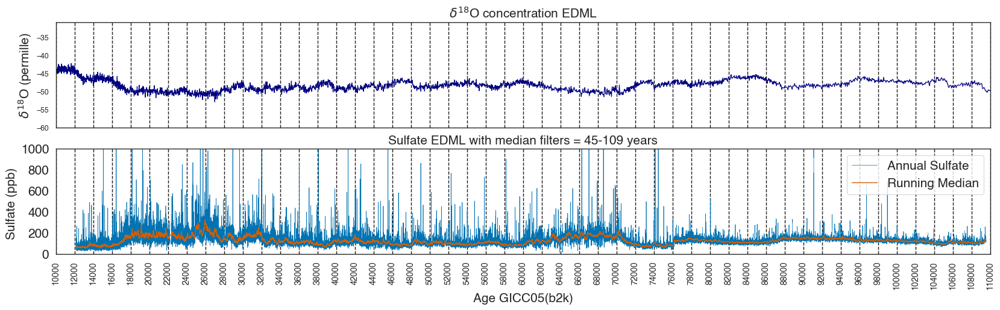

In [26]:
f, (ax1, ax2) = plt.subplots(2, 1,figsize=(20,5), sharex=True)

label_vlines = np.arange(1,len(EDML_age_list)+1,1)

EDML_age_list_int = [int(x) for x in EDML_age_list]

ax1.vlines(EDML_age_list, -60,-20, color='k', linestyle='--', linewidth=1)

ax1.set_title('$\delta^{18}$O concentration EDML', fontsize=15)
ax1.plot(EDML_d18O_age, EDML_d18O, color='navy', linewidth=.9)
ax1.set_ylabel('$\delta^{18}$O (permille)', fontsize=15)
ax1.set_ylim(-60,-31)
ax1.set_xlim(EDML_age[0], EDML_age[-1])

ax2.vlines(EDML_age_list, 0,1000, color='k', linestyle='--', linewidth=1)
ax2.set_title('Sulfate EDML with median filters = 45-109 years', fontsize=15)
ax2.plot(EDML_age, EDML_sulfate[lim_EDML], linewidth=.5, label = 'Annual Sulfate', color='b')
ax2.plot(EDML_age, EDML_RRM, linewidth = 1, label = 'Running Median', color='r')
ax2.legend(fontsize=15, loc='upper right')
ax2.set_ylim(0,1000)
ax2.set_xlabel('Age GICC05(b2k)', fontsize=15)
ax2.set_ylabel('Sulfate (ppb) ', fontsize=15)
plt.xticks(EDML_age_list, EDML_age_list_int, fontsize=10,rotation=90)
plt.yticks(fontsize=15)
plt.xlabel('Age GICC05(b2k)', fontsize=15)
#ax2.set_xlim(EDML_age_list[i], EDML_age_list[i+1])
plt.savefig('EDML_RM_d18O_intevals.jpg', dpi=1000, bbox_inches='tight')
plt.show()

### Table with data resolution and filter length 

In [27]:
print(tabulate({'Data res.': data_points, 'Interval1': EDML_age_list[:-1], 'Interval2': EDML_age_list[1:], 'Filter': EDML_filt[:-1]}, headers="keys", tablefmt='fancy_grid'))

╒═════════════╤═════════════╤═════════════╤══════════╕
│   Data res. │   Interval1 │   Interval2 │   Filter │
╞═════════════╪═════════════╪═════════════╪══════════╡
│           0 │       10000 │       12000 │       45 │
├─────────────┼─────────────┼─────────────┼──────────┤
│        3677 │       12000 │       14000 │       45 │
├─────────────┼─────────────┼─────────────┼──────────┤
│        3994 │       14000 │       16000 │       47 │
├─────────────┼─────────────┼─────────────┼──────────┤
│        3804 │       16000 │       18000 │       49 │
├─────────────┼─────────────┼─────────────┼──────────┤
│        2114 │       18000 │       20000 │       51 │
├─────────────┼─────────────┼─────────────┼──────────┤
│        2239 │       20000 │       22000 │       53 │
├─────────────┼─────────────┼─────────────┼──────────┤
│        2382 │       22000 │       24000 │       55 │
├─────────────┼─────────────┼─────────────┼──────────┤
│        2607 │       24000 │       26000 │       57 │
├─────────

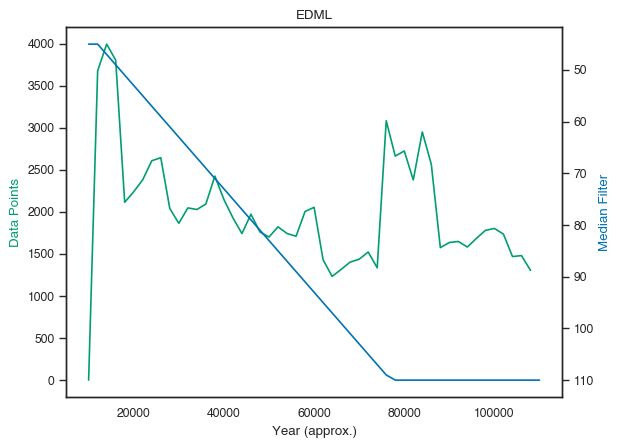

In [40]:
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(EDML_age_list[:-1], data_points, 'g')
ax2.plot(EDML_age_list, EDML_filt[:-5], 'b')
plt.title('EDML')

ax1.set_xlabel('Year (approx.)')
ax1.set_ylabel('Data Points', color='g')
ax2.set_ylabel('Median Filter', color='b')
ax2.invert_yaxis()
plt.savefig('EDML_data_points')

plt.show()

### Sulfate deposition in the ice core

In [28]:
len(EDML_sulfate), len(EDML_RRMAD)

(113241, 100283)

In [29]:
sulfate = []
y = []
sulfate_dep = []
year=[]

for i in range(len(EDML_age)):
    if EDML_sulfate[i] > EDML_RRMAD[i]:
        sulfate.append( ((EDML_sulfate[i] - EDML_RRM[i]) * EDML_thickness[i] / EDML_thinning_corr[i] ) * 0.917 )
        y.append(EDML_age[i])
    else:
        if len(sulfate) != 0: 
            sulfate_dep.append(np.nansum(sulfate))
            year.append(np.median(y))
            
            sulfate = []
            y = []
            
        else:
            continue

In [30]:
%store -r JL_age_start
%store -r JL_age_middle
%store -r JL_age_end
%store -r JL_s

EDML_jiamei_age = np.copy(JL_age_middle)
EDML_jiamei_dep = np.copy(JL_s)

print("Eruptions Jiamei =", len(EDML_jiamei_dep))

sulfate_dep = np.array(sulfate_dep)
year = np.array(year)

print("Eruptions me=", len(sulfate_dep[year<60000]))

plt.figure()
plt.bar(EDML_jiamei_age, EDML_jiamei_dep, width=200)
plt.close()

EDML_jiamei_dep_s = EDML_jiamei_dep[(EDML_jiamei_dep>10000) & (EDML_jiamei_age<60000)]
sulfate_dep_s = sulfate_dep[(year>10000) & (year<60000)]

len(sulfate_dep), len(JL_s)

Eruptions Jiamei = 86
Eruptions me= 2315


(3730, 86)

In [31]:

sulfate = []
y = []
sulfate_dep = []
year=[]

EDML_RRM = np.array(EDML_RRM)

#for j in range(len(EDML_age)):
for i in range(len(JL_s)):
    if JL_age_start[i] == np.nan:
        continue
    else:
        idx = np.where((EDML_age >=JL_age_start[i]) & (EDML_age <=JL_age_end[i]))
        if len(idx[0]) == 0:
            continue
        else:
            s =   ( ( (EDML_sulfate[idx[0]] - EDML_RRM[idx[0]]) * EDML_thickness[idx[0]] / EDML_thinning_corr[idx[0]] ) * 0.917 )
            y = JL_age_start[i]
            sulfate_dep.append(np.nansum(s))
            year.append(y)
        
print(len(JL_s), len(JL_age_start))

JL_s = np.array(JL_s, dtype='float64')
JL_age_start=np.array(JL_age_start, dtype='float64')

JL_s = JL_s[~np.isnan(JL_s)]
JL_age_start = JL_age_start[~np.isnan(JL_age_start)]

print(len(JL_s), len(JL_age_start), len(sulfate_dep))



86 86
82 82 82


### Comparing results to Lin et al (2022)

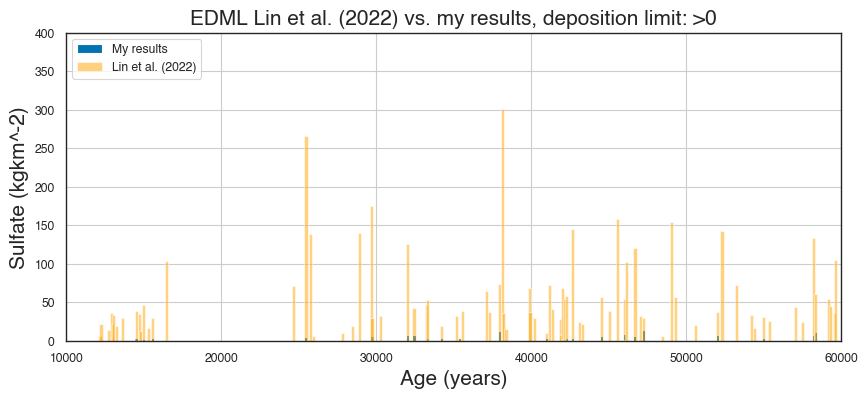

In [34]:
#list to arrays 
year = np.array(year)
sulfate_dep = np.array(sulfate_dep)
limit  = 0 #detection limit 
plt.figure(figsize=(10,4))
plt.bar(year[year<60000], sulfate_dep[year<60000], color='b', alpha=1, width=200, label='My results')
plt.bar(EDML_jiamei_age[EDML_jiamei_age>10000], EDML_jiamei_dep[EDML_jiamei_age>10000], color='orange', alpha=.5, width=200, label='Lin et al. (2022)')
plt.xlabel('Age (years)', fontsize=15)
plt.ylabel('Sulfate (kgkm^-2)', fontsize=15)
plt.xlim(10000,60000)
plt.ylim(0,400)
plt.grid('both')
plt.title('EDML Lin et al. (2022) vs. my results, deposition limit: >' + str(limit), fontsize=15)
plt.legend(loc='upper left')
plt.savefig('EDML_sulfatedep_detlim_' + str(limit), dpi=1000, bbox_inches='tight')
plt.show()

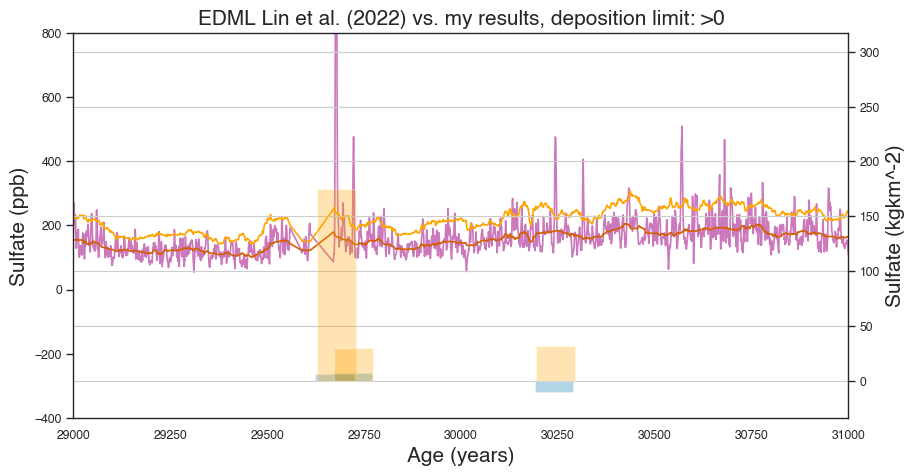

In [41]:
f, ax1 = plt.subplots(1, 1,figsize=(10,5), sharex=True, subplot_kw=dict(frameon=False))
    
ax2 = plt.twinx()

ax1.plot(EDML_age, EDML_sulfate[lim_EDML], color='m')
ax1.plot(EDML_age, EDML_RRM, color='r')
ax1.plot(EDML_age, EDML_RRMAD, color='orange')
ax1.set_ylim(-400,800)
ax2.bar(year, sulfate_dep, width=100,alpha=.3, color='b')
ax2.bar(EDML_jiamei_age, EDML_jiamei_dep, width=100, color='orange', alpha=.3)
#ax2.set_ylim(0,200)
plt.xlim(29000,31000)
ax1.set_xlabel('Age (years)', fontsize=15)
ax2.set_ylabel('Sulfate (kgkm^-2)', fontsize=15)
ax1.set_ylabel('Sulfate (ppb)', fontsize=15)
plt.title('EDML Lin et al. (2022) vs. my results, deposition limit: >' + str(limit), fontsize=15)
#plt.savefig('EDML_sulfateppb_detlim_' + str(limit), dpi=1000, bbox_inches='tight')
plt.grid('minor')
plt.show()